Se desea clasificar los tipos de tableros de vehículos eléctricos para posteriormente extraer de forma adecuada los valores de:

- Nivel de batería

- Odómetro

A continuación, se presenta el desarrollo del clasificador mencionado:

Se cuenta con una muestra inicial de las fotos tomadas por los conductores, es importante hacer la clasificación porque diariamente se generan nuevas fotos y se necesita automatizar la recolección de las variabes mencionadas

In [1]:
import os
import pandas
import cv2
from sklearn.model_selection import train_test_split
import numpy
from keras.models import Sequential
import tensorflow as tf
from tensorflow.keras import layers, models

In [2]:
#Leer las fotos almacenadas en las carpetas
ruta=r'Fotos'
fotos=None
for i in range(5):
    pre_fotos=pandas.DataFrame(os.listdir(rf'{ruta}\Tipo {i+1}')[0:500],columns=['Foto'])
    pre_fotos['Tipo']=i+1
    pre_fotos['Ruta']=rf'{ruta}\Tipo {i+1}'
    fotos=pandas.concat([fotos,pre_fotos])
fotos.reset_index(drop=True,inplace=True)
fotos=pandas.get_dummies(fotos,columns=['Tipo'],dtype=int)
fotos

,Foto,Ruta,Tipo_1,Tipo_2,Tipo_3,Tipo_4,Tipo_5
0,1737070791736698681751931333649 - Victor Corne...,Fotos\Tipo 1,1,0,0,0,0
1,173715482006957354339637589112 - Victor Cornej...,Fotos\Tipo 1,1,0,0,0,0
2,17371549320252421826342513823874 - Jose antoni...,Fotos\Tipo 1,1,0,0,0,0
3,17371626559462666580059316953544 - Victor Corn...,Fotos\Tipo 1,1,0,0,0,0
4,17374141183378523308422598946747 - Jose antoni...,Fotos\Tipo 1,1,0,0,0,0
...,...,...,...,...,...,...,...
1362,IMG-20250206-WA0006 - CNL 121.jpg,Fotos\Tipo 5,0,0,0,0,1
1363,IMG-20250206-WA0017 - CNL 010.jpeg,Fotos\Tipo 5,0,0,0,0,1
1364,IMG-20250207-WA0000 - CNK 542.jpg,Fotos\Tipo 5,0,0,0,0,1
1365,IMG-20250207-WA0000 - CNK 615.jpeg,Fotos\Tipo 5,0,0,0,0,1


In [3]:
fotos.sum()

Foto      1737070791736698681751931333649 - Victor Corne...
Ruta      Fotos\Tipo 1Fotos\Tipo 1Fotos\Tipo 1Fotos\Tipo...
Tipo_1                                                  500
Tipo_2                                                  269
Tipo_3                                                   28
Tipo_4                                                   70
Tipo_5                                                  500
dtype: object

In [4]:
size=300
images=[]
image_size=(size,size)
for i in range(len(fotos)):
    foto=fotos['Foto'][i]
    ruta=fotos['Ruta'][i]
    # print(rf'{ruta}\{foto}')
    foto=cv2.imread(rf'{ruta}\{foto}')
    foto=cv2.resize(foto,image_size)
    # cv2.imshow('foto',foto)
    # cv2.waitKey(0)
    # cv2.destroyAllWindows()
    foto=numpy.array(foto)/255
    images.append(foto)
tipo=fotos[['Tipo_1','Tipo_2','Tipo_3','Tipo_4','Tipo_5']]
X=numpy.array(images)
Y=numpy.array(tipo)
print(f'Forma de X: {X.shape}')
print(f'Forma de Y: {Y.shape}')

Forma de X: (1367, 300, 300, 3)
Forma de Y: (1367, 5)


In [ ]:
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [5]:
input_shape=(size,size,3)
model = Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Flatten())

model.add(layers.Dense(100, activation='relu'))
model.add(layers.Dense(100, activation='relu'))

model.add(layers.Dense(5, activation='softmax'))
model.summary()

c:\Users\johan\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:99: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 298, 298, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 149, 149, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 147, 147, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 73, 73, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 71, 71, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 35, 35, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 156800)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 100)            │    15,680,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 100)            │        10,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 5)              │           505 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,783,953 (60.21 MB)

 Trainable params: 15,783,953 (60.21 MB)

 Non-trainable params: 0 (0.00 B)

In [6]:
learning_rate = 0.001
optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [7]:
history = model.fit(X, Y, epochs=20, batch_size=5, validation_split=0.2)

Epoch 1/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - accuracy: 0.6421 - loss: 0.4333 - val_accuracy: 0.7993 - val_loss: 0.1906
Epoch 2/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 30s 138ms/step - accuracy: 0.9124 - loss: 0.1094 - val_accuracy: 0.8504 - val_loss: 0.1707
Epoch 3/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 30s 137ms/step - accuracy: 0.9670 - loss: 0.0433 - val_accuracy: 0.8796 - val_loss: 0.1190
Epoch 4/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 30s 137ms/step - accuracy: 0.9790 - loss: 0.0343 - val_accuracy: 0.9307 - val_loss: 0.0901
Epoch 5/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 30s 138ms/step - accuracy: 0.9884 - loss: 0.0133 - val_accuracy: 0.9270 - val_loss: 0.1150
Epoch 6/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 30s 138ms/step - accuracy: 0.9982 - loss: 0.0041 - val_accuracy: 0.8978 - val_loss: 0.1987
Epoch 7/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 30s 139ms/step - accuracy: 1.0000 - loss: 6.4822e-04 - val_accuracy: 0.9015 - val_loss: 0.2411
Epoch 8/20
219/219 ━━━━━━━━━━━━━━━━━━━━ 31s 139ms/step - accuracy: 1.0000 - los

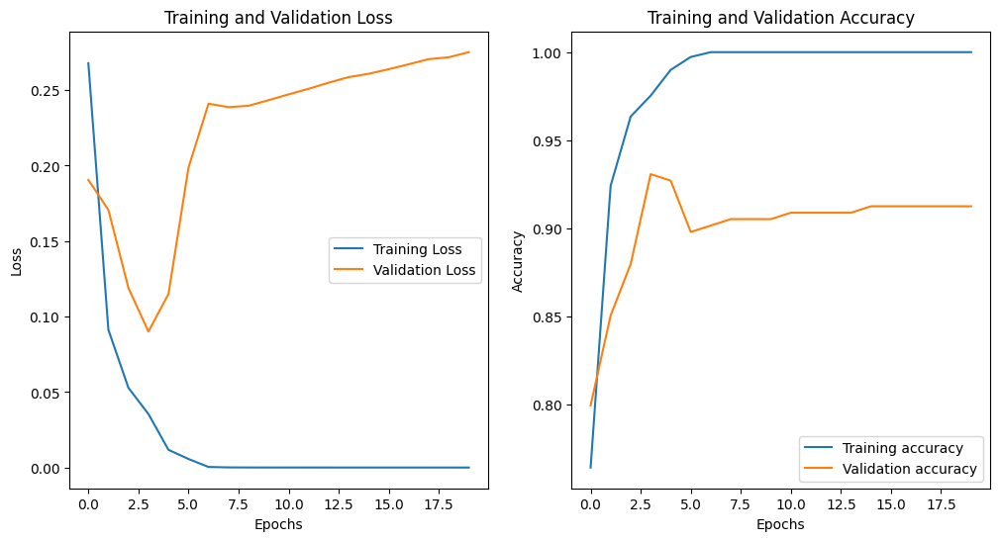

In [8]:
import matplotlib.pyplot as plt

# Graficar la pérdida (loss)
plt.figure(figsize=(12, 6))

# Pérdida en el conjunto de entrenamiento
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Error Absoluto Medio (MAE) en el conjunto de entrenamiento
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training accuracy')
plt.plot(history.history['val_accuracy'], label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

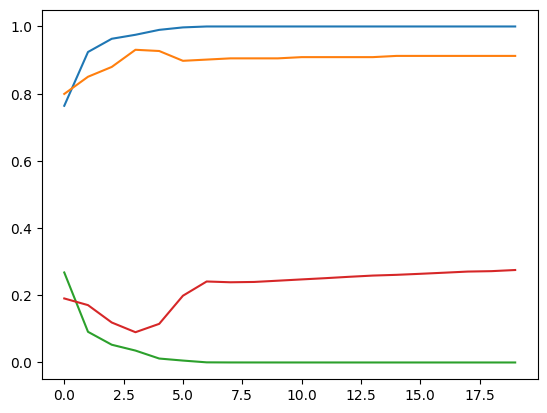

In [9]:
#plot learning curves
from matplotlib import pyplot as plt
plt.plot(history.history['accuracy'], label='train')
plt.plot(history.history['val_accuracy'], label='test')

plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')

In [10]:
model.save('model_6.h5')

In [11]:
ruta=r'Fotos'
fotos_pred=None
for i in range(5):
    pre_fotos=pandas.DataFrame(os.listdir(rf'{ruta}\Tipo {i+1}'),columns=['Foto'])
    pre_fotos['Tipo']=i+1
    pre_fotos['Ruta']=rf'{ruta}\Tipo {i+1}'
    fotos_pred=pandas.concat([fotos_pred,pre_fotos])
fotos_pred.reset_index(drop=True,inplace=True)
fotos_pred=pandas.get_dummies(fotos_pred,columns=['Tipo'],dtype=int)
fotos_pred

,Foto,Ruta,Tipo_1,Tipo_2,Tipo_3,Tipo_4,Tipo_5
0,1737070791736698681751931333649 - Victor Corne...,Fotos\Tipo 1,1,0,0,0,0
1,173715482006957354339637589112 - Victor Cornej...,Fotos\Tipo 1,1,0,0,0,0
2,17371549320252421826342513823874 - Jose antoni...,Fotos\Tipo 1,1,0,0,0,0
3,17371626559462666580059316953544 - Victor Corn...,Fotos\Tipo 1,1,0,0,0,0
4,17374141183378523308422598946747 - Jose antoni...,Fotos\Tipo 1,1,0,0,0,0
...,...,...,...,...,...,...,...
1988,IMG_20250213_073431 - Juan Manuel Orbegozo Mor...,Fotos\Tipo 5,0,0,0,0,1
1989,IMG_20250213_162628 - Juan Manuel Orbegozo Mor...,Fotos\Tipo 5,0,0,0,0,1
1990,IMG_20250214_075457 - Juan Manuel Orbegozo Mor...,Fotos\Tipo 5,0,0,0,0,1
1991,IMG_20250214_164810 - Juan Manuel Orbegozo Mor...,Fotos\Tipo 5,0,0,0,0,1


In [12]:
# size=250
images_pred=[]
image_size=(size,size)
for i in range(len(fotos_pred)):
    foto=fotos_pred['Foto'][i]
    ruta=fotos_pred['Ruta'][i]
    # print(rf'{ruta}\{foto}')
    foto=cv2.imread(rf'{ruta}\{foto}')
    foto=cv2.resize(foto,image_size)
    # cv2.imshow('foto',foto)
    # cv2.waitKey(0)
    # cv2.destroyAllWindows()
    foto=numpy.array(foto)/255
    images_pred.append(foto)

In [13]:
tipo=fotos_pred[['Tipo_1','Tipo_2','Tipo_3','Tipo_4','Tipo_5']]
X=numpy.array(images_pred)
Y=numpy.array(tipo)
print(f'Forma de X: {X.shape}')
print(f'Forma de Y: {Y.shape}')

Forma de X: (1993, 300, 300, 3)
Forma de Y: (1993, 5)


In [88]:
Y_predic=pandas.DataFrame(model.predict(X),
                          columns=['Tipo_1_pred','Tipo_2_pred','Tipo_3_pred','Tipo_4_pred','Tipo_5_pred'])
for i in Y_predic.columns:
    Y_predic[i.replace('_pred','_prob')]=Y_predic[i].apply(lambda x:round(x,4))
    Y_predic[i]=Y_predic[i].apply(lambda x:round(x,0))
    # Y_predic.rename(columns={i:i.replace('_','__')},inplace=True)
Y_predic

63/63 ━━━━━━━━━━━━━━━━━━━━ 10s 140ms/step


,Tipo_1_pred,Tipo_2_pred,Tipo_3_pred,Tipo_4_pred,Tipo_5_pred,Tipo_1_prob,Tipo_2_prob,Tipo_3_prob,Tipo_4_prob,Tipo_5_prob
0,1.0,0.0,0.0,0.0,0.0,1.0000,0.0000,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,1.0000,0.0000,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,0.0,1.0000,0.0000,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,1.0000,0.0000,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,1.0000,0.0000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
1988,0.0,0.0,0.0,0.0,1.0,0.0000,0.0000,0.0,0.0,1.0
1989,0.0,0.0,0.0,0.0,1.0,0.0000,0.0000,0.0,0.0,1.0
1990,0.0,0.0,0.0,0.0,1.0,0.0000,0.0000,0.0,0.0,1.0
1991,1.0,0.0,0.0,0.0,0.0,0.9018,0.0982,0.0,0.0,0.0


In [89]:
fotos_pred.join(Y_predic).to_excel('Results.xlsx',index=False,sheet_name='Predict')

In [40]:
Y_pred=model.predict(X)

63/63 ━━━━━━━━━━━━━━━━━━━━ 9s 137ms/step


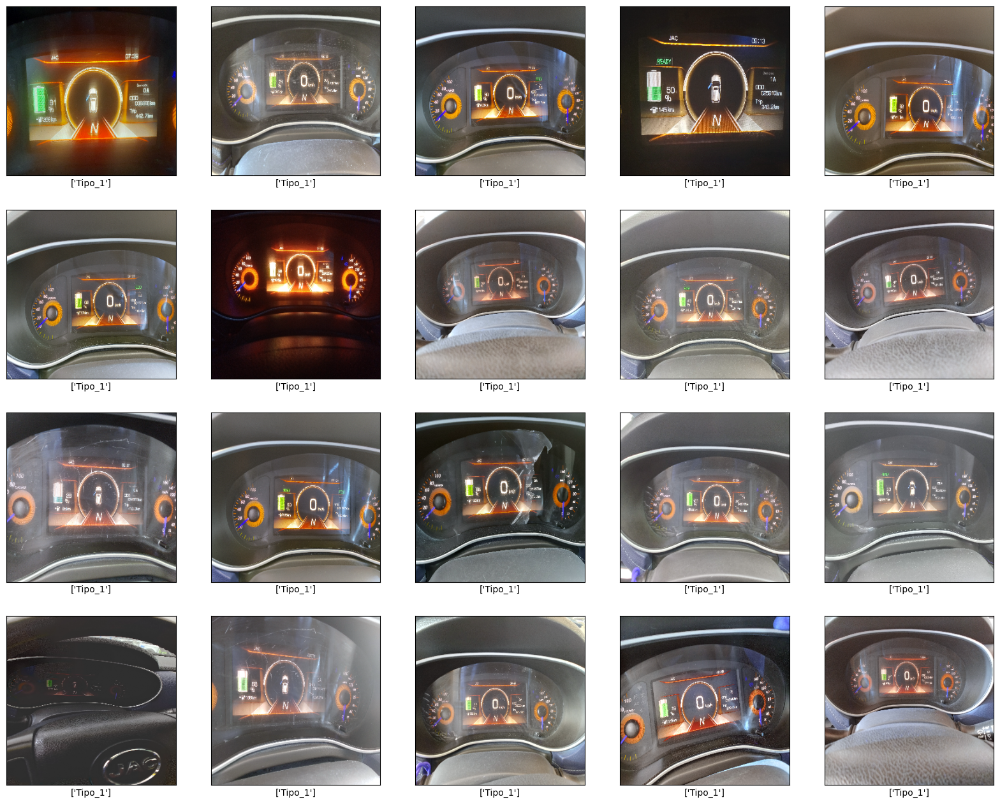

In [75]:
columns=numpy.array(["Tipo_1", "Tipo_2", "Tipo_3", "Tipo_4", "Tipo_5"])
threshold = 0.5
# plt.grid(False)
plt.figure(figsize=(20,20))
for i in range(20):
    plt.subplot(5,5,i+1)
    i+=0
    active_classes=Y_predic[i] >= threshold
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.xlabel(columns[active_classes])
    plt.imshow(X[i])

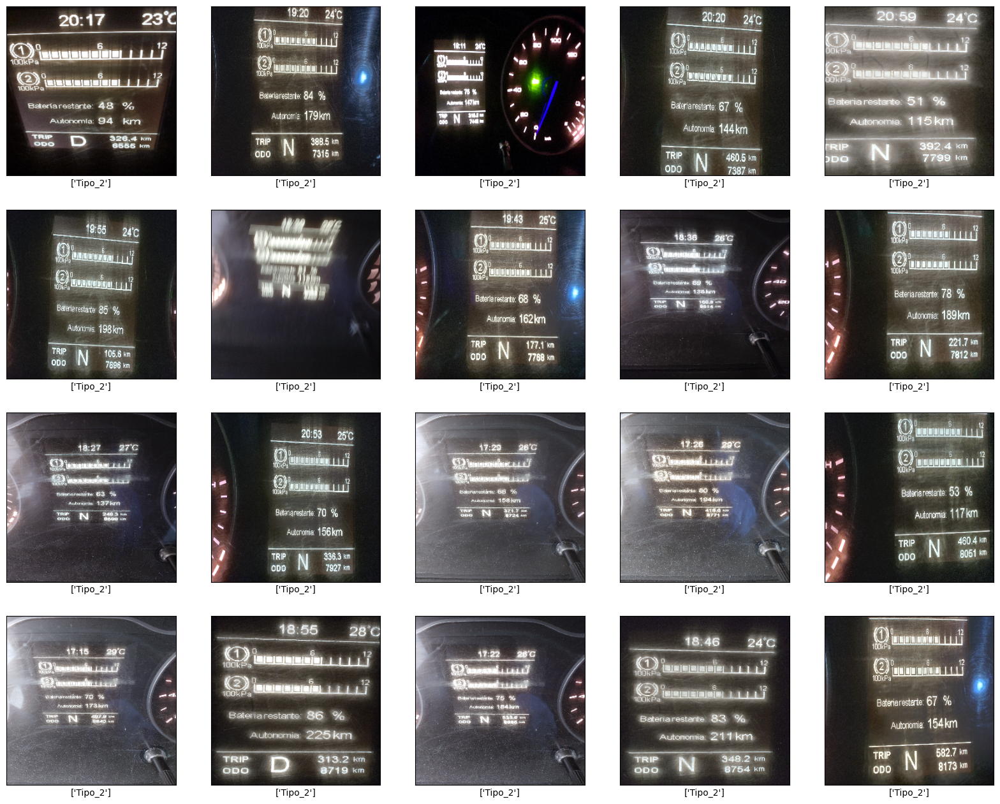

In [76]:
columns=numpy.array(["Tipo_1", "Tipo_2", "Tipo_3", "Tipo_4", "Tipo_5"])
threshold = 0.5
# plt.grid(False)
plt.figure(figsize=(20,20))
for i in range(20):
    plt.subplot(5,5,i+1)
    i+=1000
    active_classes=Y_predic[i] >= threshold
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.xlabel(columns[active_classes])
    plt.imshow(X[i])

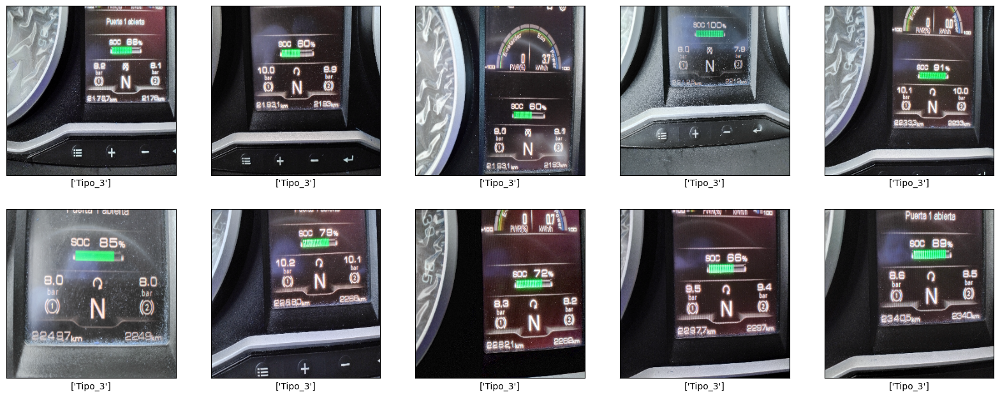

In [81]:
columns=numpy.array(["Tipo_1", "Tipo_2", "Tipo_3", "Tipo_4", "Tipo_5"])
threshold = 0.5
# plt.grid(False)
plt.figure(figsize=(20,20))
for i in range(10):
    plt.subplot(5,5,i+1)
    i+=1275
    active_classes=Y_predic[i] >= threshold
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.xlabel(columns[active_classes])
    plt.imshow(X[i])

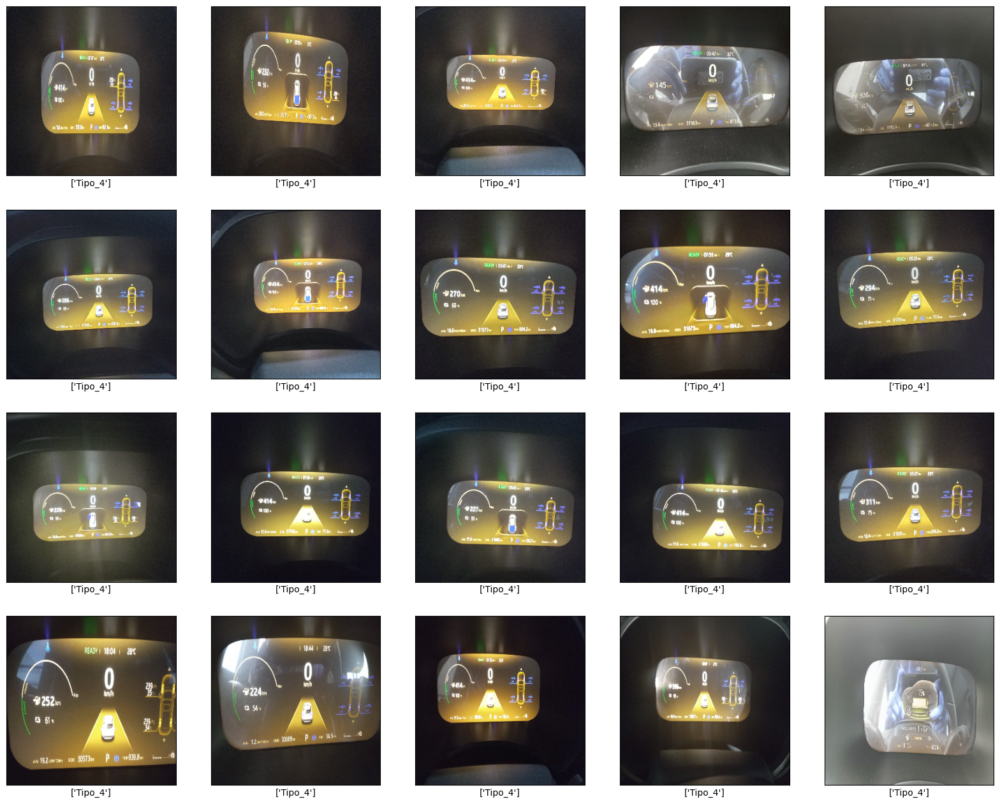

In [77]:
columns=numpy.array(["Tipo_1", "Tipo_2", "Tipo_3", "Tipo_4", "Tipo_5"])
threshold = 0.5
# plt.grid(False)
plt.figure(figsize=(20,20))
for i in range(20):
    plt.subplot(5,5,i+1)
    i+=1300
    active_classes=Y_predic[i] >= threshold
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.xlabel(columns[active_classes])
    plt.imshow(X[i])

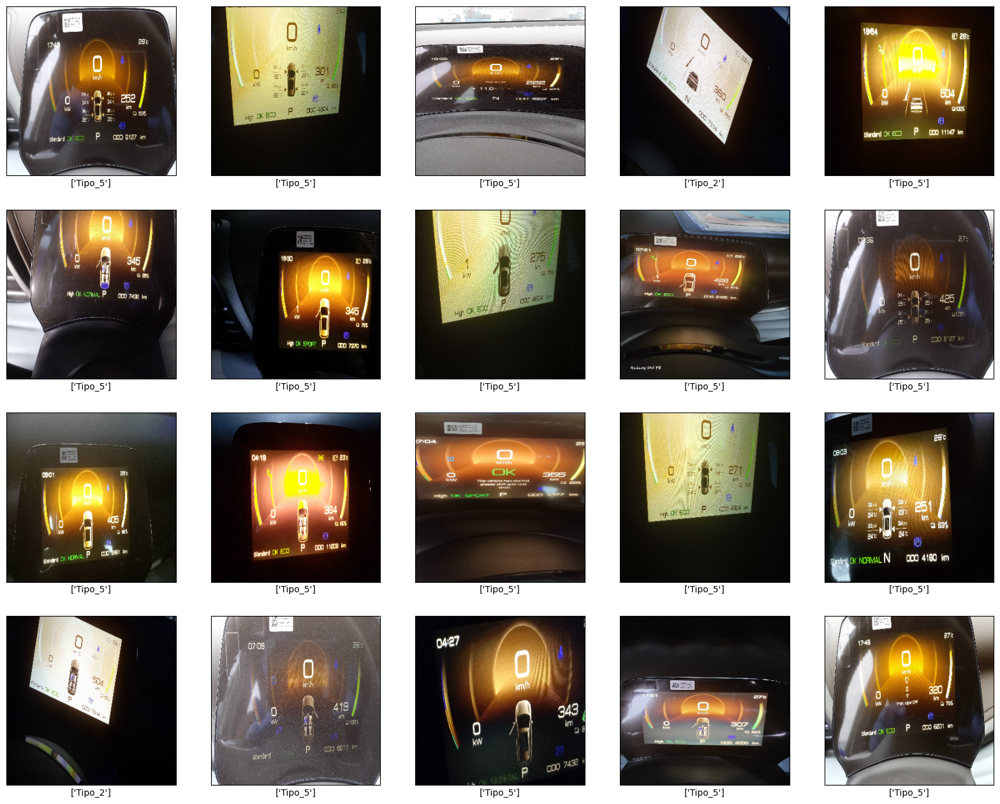

In [86]:
columns=numpy.array(["Tipo_1", "Tipo_2", "Tipo_3", "Tipo_4", "Tipo_5"])
threshold = 0.5
# plt.grid(False)
plt.figure(figsize=(20,20))
for i in range(20):
    plt.subplot(5,5,i+1)
    i+=1900
    active_classes=Y_predic[i] >= threshold
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.xlabel(columns[active_classes])
    plt.imshow(X[i])